In [60]:
import Plots
import LinearAlgebra

(1)
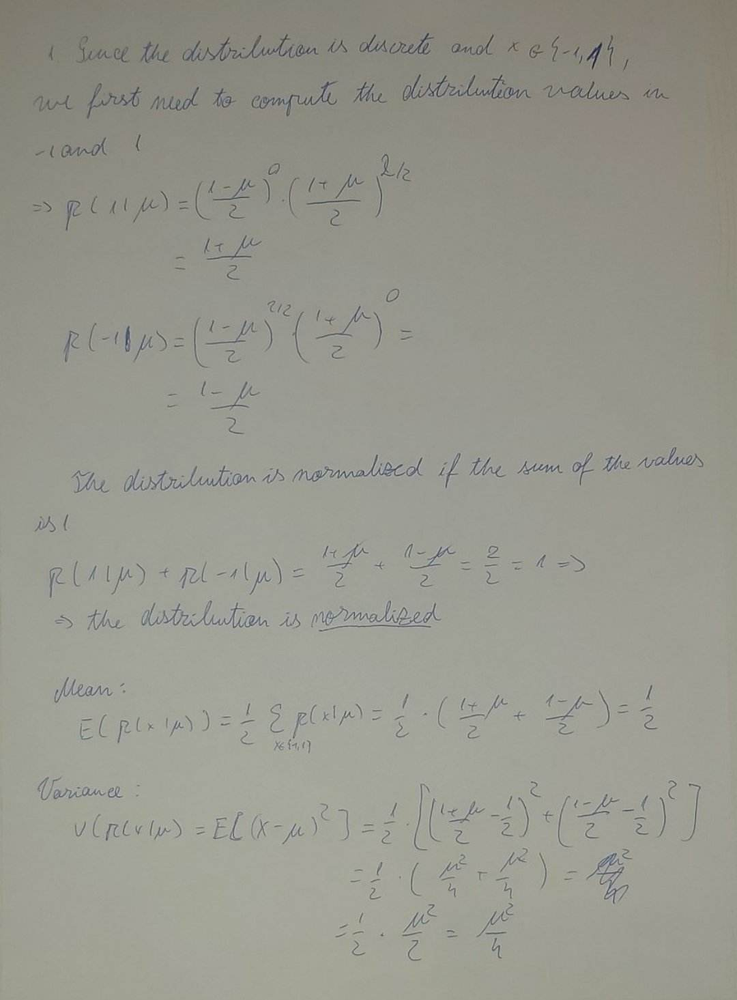
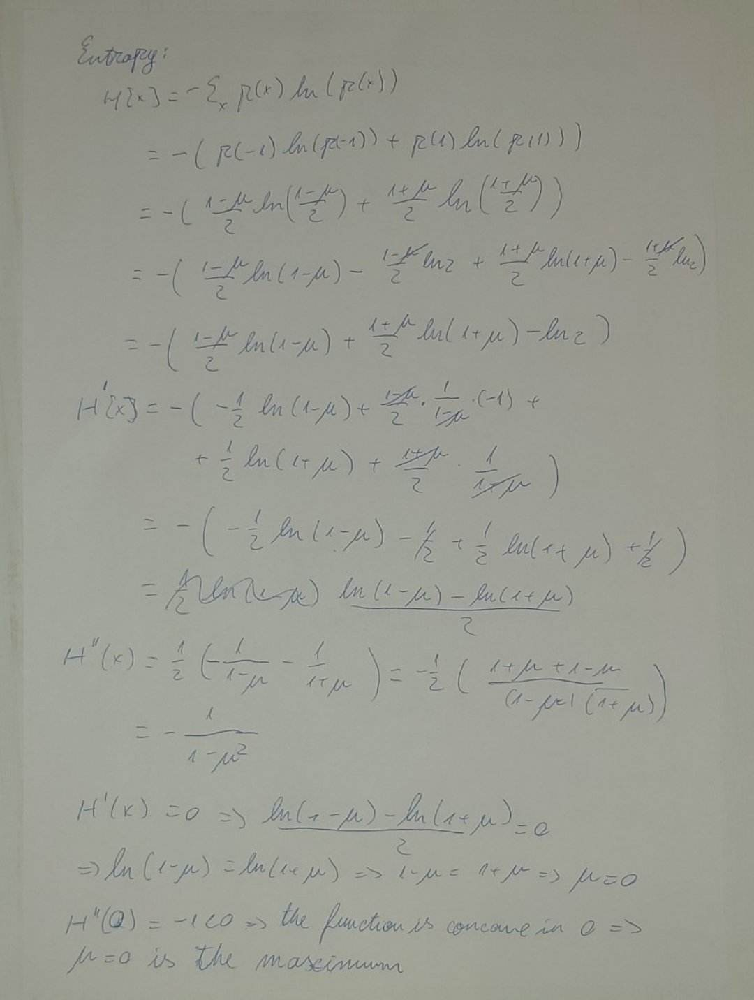

2.

In [83]:
#  L_1 - Laplace - error
e1(z,l) =l*abs(z)/2
# L_2 - quadratic - error
e2(z,s) =z.^2 / (2*s)
# Laplace - exponential - sampling
sam1(n,ell) = -ell*sign.(rand(n).-0.5).*log.(rand(n))
# Gauss -- normal -- sampling
sam2(n,s) =s*randn(n)

sam2 (generic function with 1 method)

(a) As we can see below, the two parameters help in scaling the errors or controling the strength of the error, thus they help defining how bad or good is a certain value. In the case of L1 error, if $\lambda$ is increased the error increases, if it is decreseased, the error decreases, but in the case of L2, the opposite happens, if $\sigma$ increases, then the error decreases, and if it decreases, the error increases.

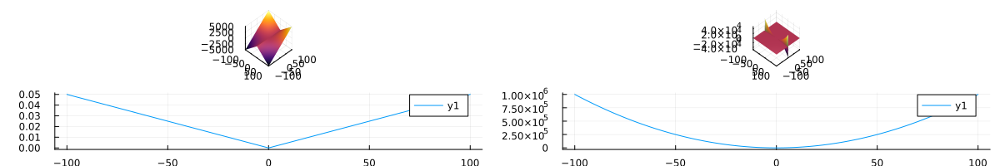

In [18]:
start = -100
stop = 100
length = 1000
camera = [45, 45]

z = l = range(start, stop = stop, length = length)
p1 = Plots.surface(    
    z, l,             
    e1,
    colorbar=false,    
    camera=camera
)

z = s = range(start, stop = stop, length = length)
p2 = Plots.surface(    
    z, s,             
    e2,
    colorbar=false,    
    camera=camera
)

z = range(start, stop = stop, length = length)
p3 = Plots.plot(    
    z,             
    z -> e1(z, 0.001)
)

z = range(start, stop = stop, length = length)
p4 = Plots.plot(    
    z,             
    z -> e2(z, 0.0050)
)


Plots.plot(p1, p2, p3, p4, layout=(2,2), size=(1200, 200))

(b)

In [136]:
no_samples = 10000

gauss_samples = sam2(no_samples, 2)
laplace_samples = sam1(no_samples, 2)

p_gauss = Plots.histogram(gauss_samples,
    bins=3000,
    size=(400,140),
    legend=false,
    title="Gauss"
)

p_laplace = Plots.histogram(laplace_samples,
    bins=3000,
    size=(400,140),
    legend=false,
    title="Laplace"
)

Plots.plot(p_gauss, p_laplace, layout=(2,1), size=(1200, 200))


(c) The 2 quantities seem to be correlated for each case, meaning that most values are centered in the middle.

In [145]:
#gauss_samples = sam2(no_samples, 2)
#laplace_samples = sam1(no_samples, 2)

p_laplace = Plots.plot(    
    #-exp.(laplace_samples),             
    z -> exp.(-e1(z, 2)),
    title="Laplace"
)



p_gauss = Plots.plot(    
    #-exp.(gauss_samples),             
    z -> exp.(-e2(z, 2)),
    title="Gauss",
    
)

Plots.histogram!(p_gauss, gauss_samples, norm=true,
    bins=3000,
    size=(400,140),
    legend=false,
    title="Gauss"
)
Plots.histogram!(p_laplace, laplace_samples,norm=true,
    bins=3000,
    size=(400,140),
    legend=false,
    title="Laplace"
)


Plots.plot(p_gauss, p_laplace, layout=(2,1), size=(1200, 200))

(d)

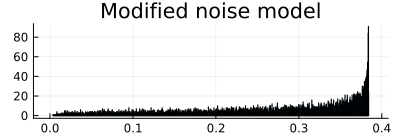

In [245]:
normal(z, s, m=0) = 1/(s*sqrt(2*pi)) * exp(-1/2*((z-m)/s)^2)
laplace(z, l, m=0) = 1/(2*l)*exp(-abs(z-m)/l)

modified_noise_model(z, eps, s, lambda) = (1-eps) * normal(z, s) + eps*laplace(z, lambda)


 
 
sample(dim,σ_0,μ_0=zeros(dim))= μ_0 + σ_0 * randn(dim,1)

no_samples = 10000

samples = [modified_noise_model(z, 0.1, 1, 2) for z in sample(no_samples, 1)]

Plots.histogram(samples,
    bins=3000,
    size=(400,140),
    legend=false,
    title="Modified noise model"
)

(e) As we can see below, the negative logarithm of the 3 likelyhood functions is convex

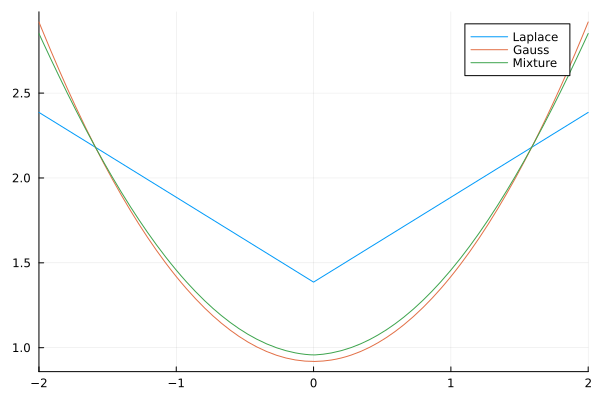

In [242]:
p= Plots.plot(                
    z -> -log(laplace(z, 2)),
    label="Laplace",
    xlim=(-2,2)
)

Plots.plot!(p,              
    z -> -log(normal(z, 1)),
    label="Gauss"
)
 
Plots.plot!(p,              
    z -> -log(modified_noise_model(z, 0.1, 1, 2)),
    label="Mixture"
)

    


(f)

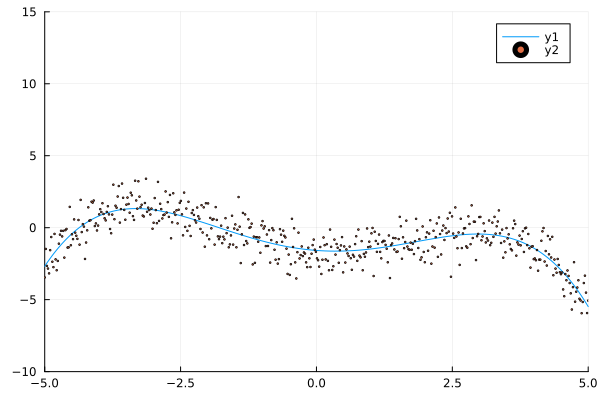

In [251]:
f(x) = (2*(x .− 1).^2 − (x.^2 .− 9).^2 − x.*10)/50

N = 500

sample_modified_noise_model(n, eps, s, lambda) = (1-eps) * sam2(n, s) + eps*sam1(n, lambda)


x = [i for i in range(-5, stop=5, length=N)]
noise = sample_modified_noise_model(N, 0.1, 1, 2)
y = f(x) .+ noise


p= Plots.plot(f, ylim=(-10, 15), xlim=(-5, 5))
Plots.scatter!(x, y, markersize=1)

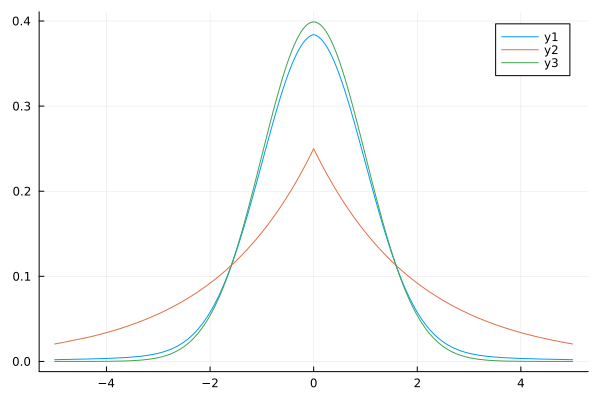

In [252]:
Plots.plot(x->modified_noise_model(x, 0.1, 1,2))
Plots.plot!(x->laplace(x, 2))
Plots.plot!(x->normal(x, 1))


In [ ]:
x_val = [i for i in range(-5, stop=5, length=1000)]
y_val = f(x_val)

Ns = [10, 20, 50, 100, 200, 500, 1000, 2000]
errors = []
@show "start"
for N in Ns
    error = 0
    for K in range(1, stop=50)    
        @show K
        x_train = [i for i in range(-5, stop=5, length=N)]
        noise = sample_modified_noise_model(N, 0.1, 1, 2)
        y_train = f(x_train) .+ noise

        k = 5
        A = hcat([x_train.^j for j=0:k-1]...)
        b = y_train

        linear(height,a) = LinearAlgebra.dot([height^i for i=0:k-1], a)
        pred = [linear(x, A\b) for x in x_val]

        error += sum(abs.(y_val - pred)) / 1000
    end
    push!(errors, error/50)
    @show N, error/50
end

for i in range(1, stop=8)
    @show Ns[i], errors[i]
end


In [ ]:

@show "start"